In [9]:
import scanpy as sc
import matplotlib.pyplot as plt
import numpy as np
import os
from sklearn.decomposition import NMF
from sklearn.cluster import KMeans

In [2]:
basepath = '/stanley/WangLab/kamal/code/remote_notebooks/spin_supps/figures/'
figsize = (5,6)
s = 10
dpi = 300

In [3]:
adata = sc.read_h5ad('/stanley/WangLab/kamal/code/remote_notebooks/spatial_autocorrelation/adata_all_techniques.h5ad')

In [4]:
n_factors = 25
nmf = NMF(n_components=n_factors)
X = adata.layers['smooth'].copy()
X -= X.min()
adata.obsm['X_nmf'] = nmf.fit_transform(X)

/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:312: FutureWarning: The 'init' value, when 'init=None' and n_components is less than n_samples and n_features, will be changed from 'nndsvd' to 'nndsvda' in 1.1 (renaming of 0.26).
  warnings.warn(("The 'init' value, when 'init=None' and "
/stanley/WangLab/envs/neighbors/lib/python3.9/site-packages/sklearn/decomposition/_nmf.py:1090: ConvergenceWarning: Maximum number of iterations 200 reached. Increase it to improve convergence.
  warnings.warn("Maximum number of iterations %d reached. Increase it to"


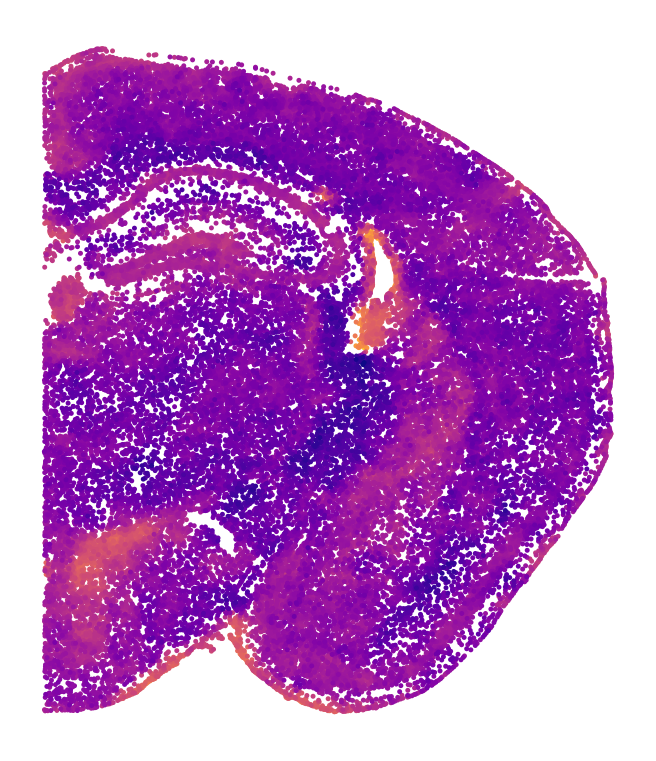

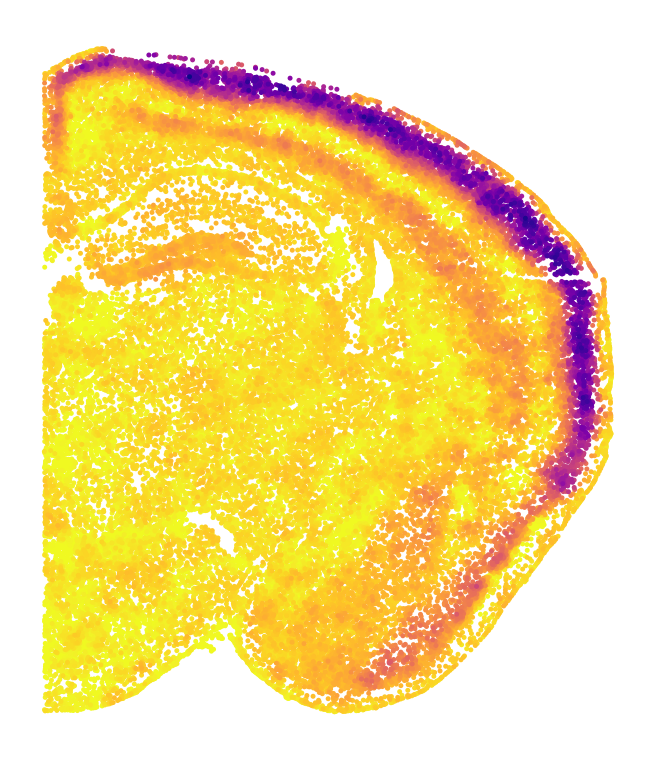

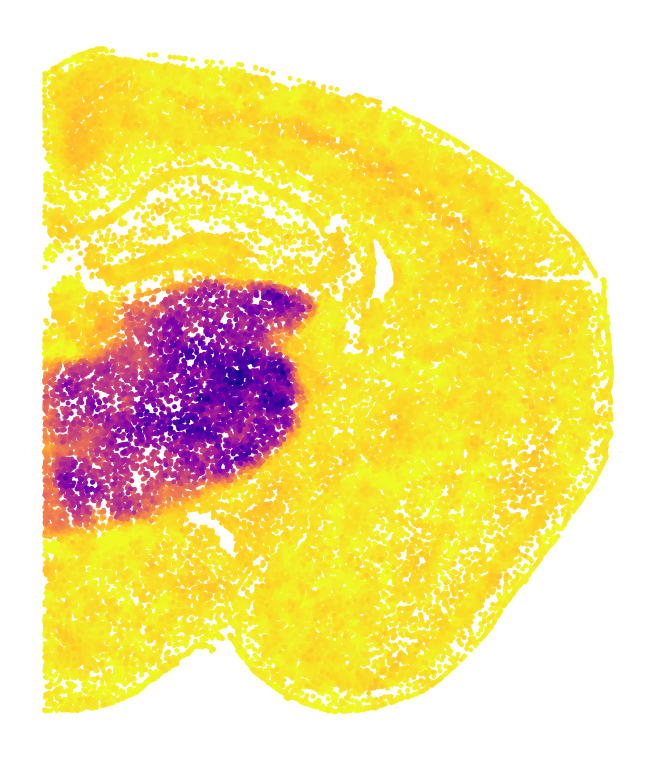

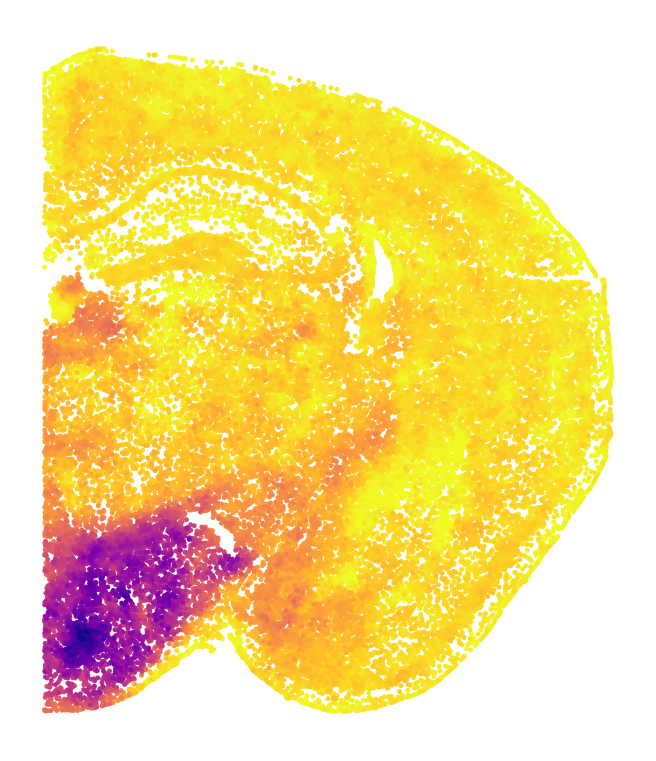

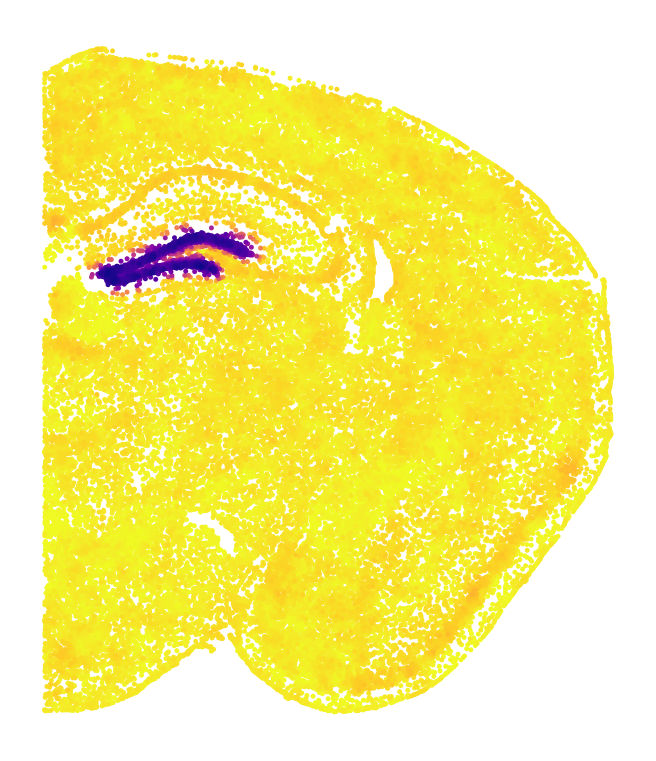

...

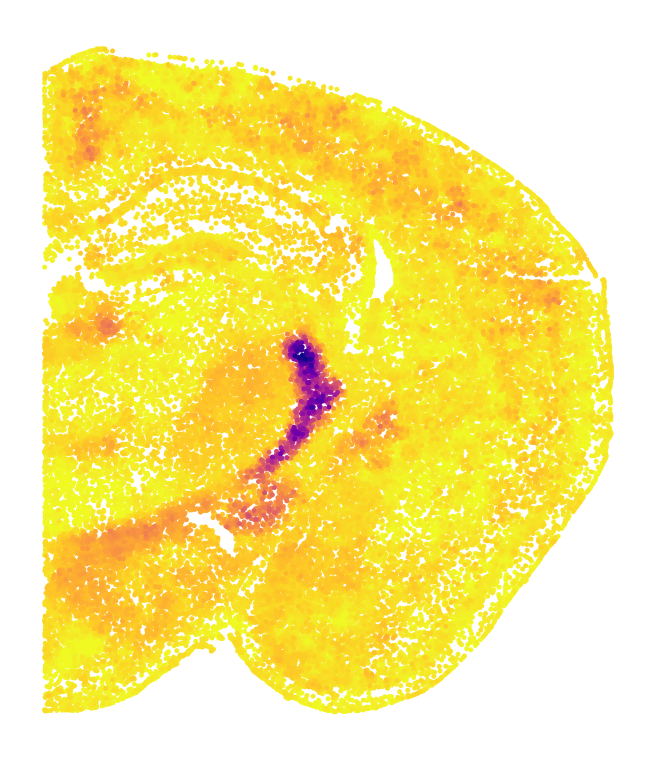

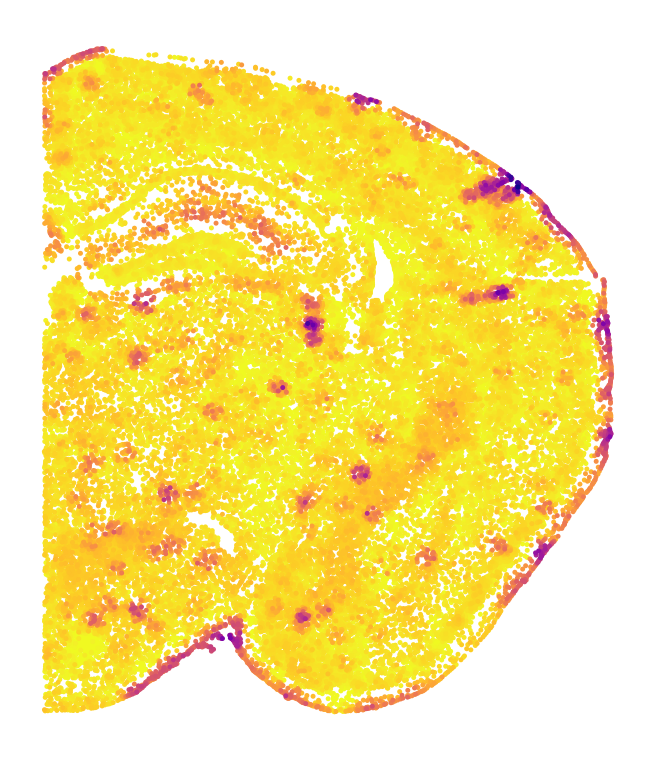

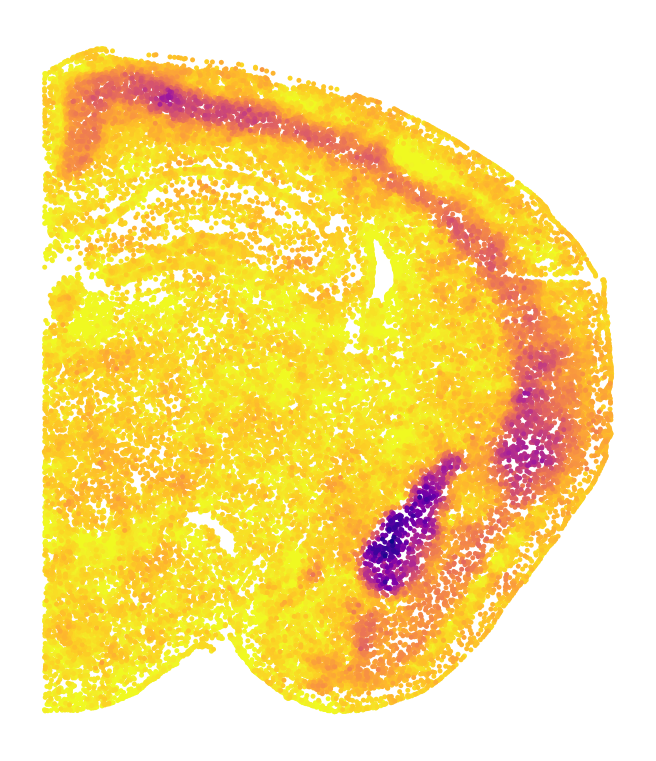

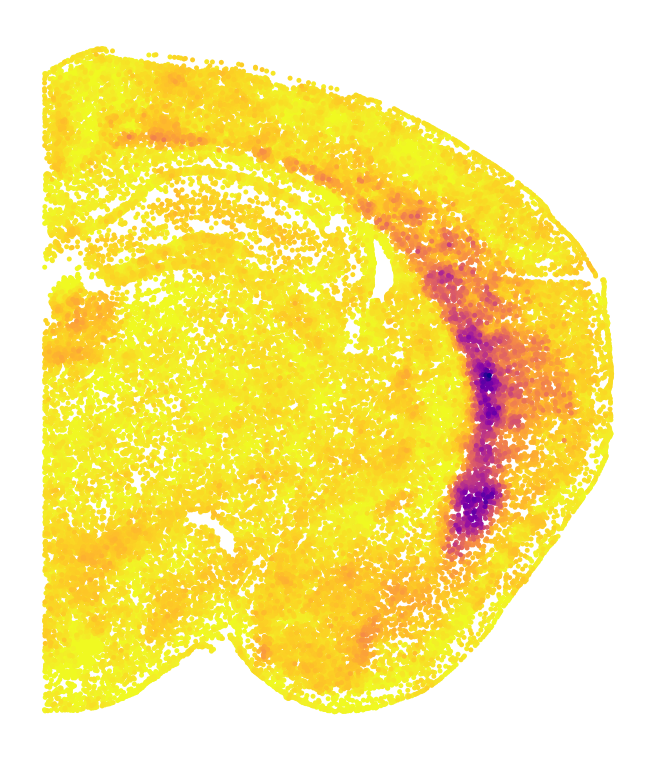

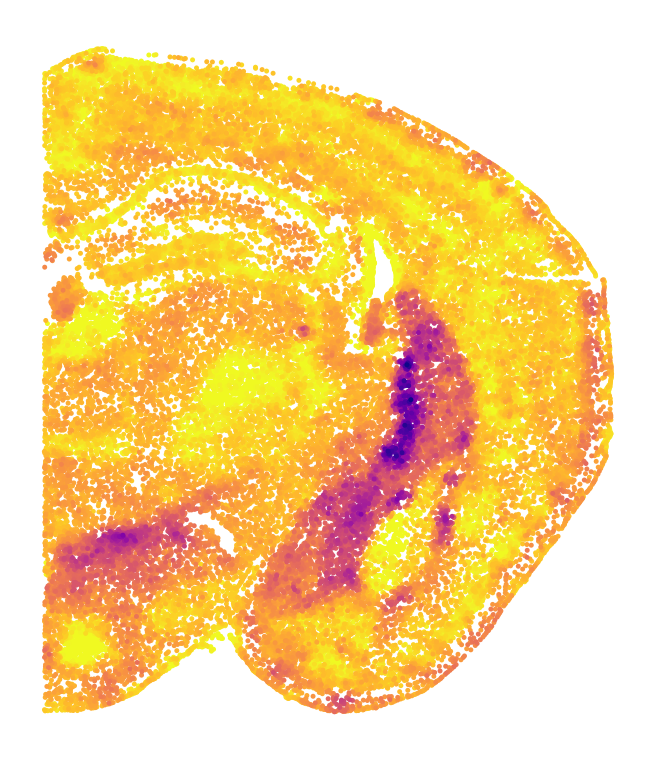

In [8]:
sc.set_figure_params(figsize=figsize)
for i in range(n_factors):
    adata.obs['factor'] = adata.obsm['X_nmf'][:,i]
    sc.pl.embedding(adata, basis='spatial', color='factor', s=20, colorbar_loc=None, return_fig=True, title='', cmap='plasma_r')
    plt.axis('off')
    figname = f'tissue_colored_by_factor{i+1}.png'
    savepath = os.path.join(basepath, figname)
    plt.savefig(savepath, bbox_inches='tight', transparent=True, dpi=dpi)
    plt.show()
    plt.close()